# PATHOverview interactive notebook

**This notebook contains an interactive figure for setting PATHOverview parameters followed the generation of multi-panel figures. Basic slide details are imported from and saved to an Excel file which can be generated with [PATHOverview_list_files.ipynb](pathoverview_list_files.ipynb). This tool was used to enable the quick roation, crop and zoom of many slides for preparation of multi-panel multi-page figures for our paper.** Finer control of zoom_point can be achieved using ndpa slide annotation files. More details can be found in [pathoverview_list_files.ipynb](pathoverview_list_files.ipynb).<br>
To generate multi-panel figures from Excel alone use [pathoverview_create_figures.ipynb](pathoverview_create_figures.ipynb).<br>

This example uses test_files\slide_lists_demo.xlsx to generate example figures using freely available ndpi images from OpenSlide. OS-1.ndpi and OS-2.ndpi should be downloaded from [here](https://openslide.cs.cmu.edu/download/openslide-testdata/Hamamatsu/) and added to the test_files folder.

Details of PATHOverview Excel sheet parameters are described in [PATHOverview_list_files.ipynb](pathoverview_list_files.ipynb).

PATHOverview rotates, crops and zooms images to generate customised figures.<br>
PATHOverview requires the packages:<br>
- Both the OpenSlide main package and openslide-python bindings are required<br>
These can be installed with:
`pip install openslide-python openslide-bin`
- pillow, openpyxl, matplotlib, pandas, ipywidgets, ipympl

Slides are loaded as pathoverview.slide_obj objects with the interactive figure generating the following properties:
- .rotation = rotation of the slide in degrees.
- .mirror = True/False to flip the image.
- .zoom_point = tuple of the point on the slide to centre zoom image on. Coordinates are given relative to the unrotated uncropped slide size. <br>
ie. (0.5,0.5) is the centre of the slide.
- .crop = tuple containing ((coordinates of centre of the crop ROI; as .zoom_point), crop width relative to unrotated slide width, crop height relative to unrotated slide height). <br>
ie. ((0.5,0.5), 0.75, 0.75) will give a ROI centred on the slide centre with width and height 0.75x that of the slide

**To use this example:**
- Install PATHOverview and the required packages
- Download the example ndpi files from above
- Run cells up to "# show the interactive figure and navigation buttons"
- Set the required parameters for each slide:
    - Right click: rotate this point to top
    - Double click: set zoom point
    <br>(Red dot is slide centre. Green x is zoom_point")
    - Draw box: set crop region
    - Click Save & Next
    - Run all the subsequent cells



In [1]:
import pathoverview
from pathoverview import pathoverview_interactive_fig, slide_obj, pathofigure

# matplotlib is used to generate the interactive figure
%matplotlib widget
import matplotlib
import matplotlib.pyplot as plt
# set interactive (with reference to IPython) to false so figures are only drawn when needed
matplotlib.interactive(False) 

# ipywidget supplies interactive buttons used for moving between slides
from ipywidgets import Layout, widgets

# Pandas handles excel sheet <-> data frame data handling
import pandas as pd

# The python builtin Path is used to handle filepaths nicely between windows and mac
from pathlib import Path

In [2]:
# With older OpenSlide install methods on windows, the path to your OpenSlide binaries 
# must be defined before first slide_obj creation.
# This is not requred/used on mac or newer OpenSlide installs.

# pathoverview.OPENSLIDE_PATH = Path(r'C:\openslide\bin')

In [3]:
slides_excel = Path(r"./test_files/slide_lists_demo.xlsx")
slides_df = pd.read_excel(slides_excel, sheet_name="slides", index_col=0)
slides_df = slides_df.astype('object')

# rebuild hyperlink which gets read as str("Link")
if "link" in slides_df.columns:
    slides_df["link"] = '=HYPERLINK("' + slides_df['rel_path'] + '", "Link")'

slides_df = slides_df.sort_values(["page","order"]).reset_index(drop= True)
print(len(slides_df))

14


In [4]:
# helper functions for changing between slides
sld = 0

def get_next_row(direction = 1):
    global sld
    sld = (sld + direction) % len(slides_df)
    return slides_df.iloc[sld]

In [5]:
# functions for navigation buttons
def button_next(_):
    #myfig.load_image(get_next_image(1))
    #myfig.load_data(slides_df.iloc[sld])
    myfig.load_slide(get_next_row(1))
    slide_selector.index = sld
    myfig.update_fig()

def button_prev(_):
    # myfig.load_image(get_next_image(-1))
    # myfig.load_data(slides_df.iloc[sld])
    myfig.load_slide(get_next_row(-1))
    slide_selector.index = sld
    myfig.update_fig()
    
def button_save(_):
    global slides
    data = myfig.get_data()
    for key, val in data.items():
        slides_df.at[sld,key] = val

def button_savenext(_):
    button_save(None)
    button_next(None)

def button_reset(_):
    myfig.reset_fig()
    myfig.update_fig()

def button_mirror(_):
    myfig.mirror =  not myfig.mirror
    #myfig.clear_rect()
    myfig.update_fig()

def dropdown_change(change):
    global sld
    if change['type'] == 'change' and change['name'] == 'index':
        sld = change['new']
        # myfig.load_image(get_image_filename(sld))
        # myfig.load_data(slides_df.iloc[sld])
        myfig.load_slide(slides_df.iloc[sld])
        myfig.update_fig()

b_layout = Layout(width='15%')
next_button = widgets.Button(description='>', layout=b_layout)
next_button.on_click(button_next)

prev_button = widgets.Button(description='<', layout=b_layout)
prev_button.on_click(button_prev)

save_button = widgets.Button(description='Save', layout=b_layout)
save_button.on_click(button_save)

savenext_button = widgets.Button(description='Save & >', layout=b_layout)
savenext_button.on_click(button_savenext)

reset_button = widgets.Button(description='Reset', layout=b_layout)
reset_button.on_click(button_reset)

mirror_button = widgets.Button(description='Mirror', layout=b_layout)
mirror_button.on_click(button_mirror)

slide_selector = widgets.Dropdown(
    options= slides_df["page"].astype(str) + "-" + slides_df["order"].astype(str) \
             + " - " + slides_df["file"].astype(str) + " - " + slides_df["label"].astype(str),
    index=sld,
    description='Slide:',
    disabled=False,
)
slide_selector.observe(dropdown_change)

In [6]:
# Create an interactive figure
myfig = pathoverview_interactive_fig()
#myfig.load_image(get_next_image(0))
#myfig.load_data(slides_df.iloc[0])
myfig.load_slide(slides_df.iloc[0])
myfig.update_fig()

Right click: rotate this point to top
Double click: set zoom point
Draw box: set crop region
Red dot is slide centre. Green x is zoom_point


Dropdown(description='Slide:', options=('0-0 - OS-1.ndpi - Type: raw', '0-1 - OS-1.ndpi - Type: slide', '0-4 -…

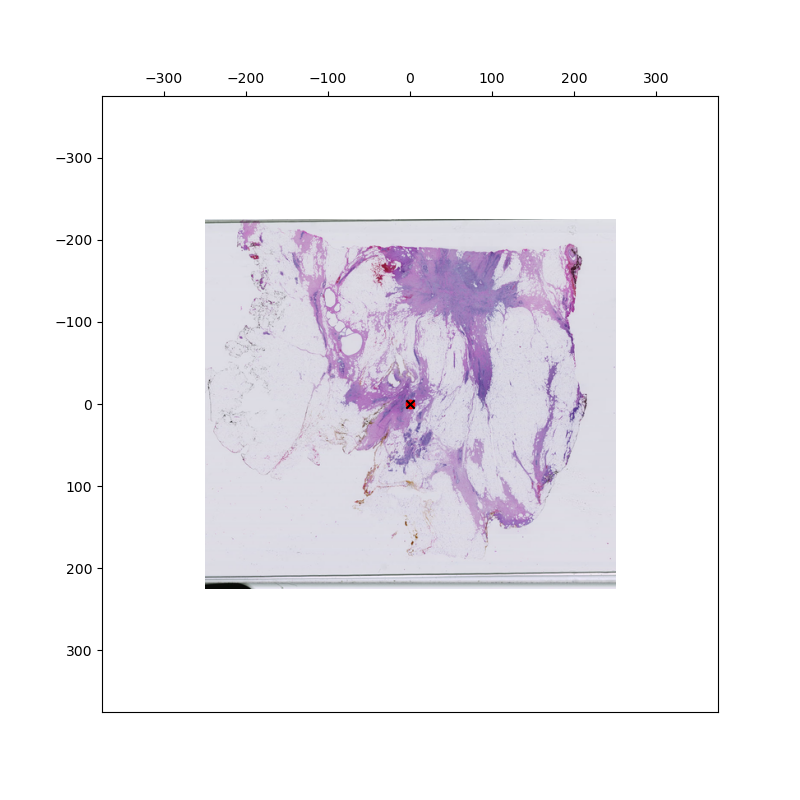

In [7]:
# show the interactive figure and navigation buttons
print("Right click: rotate this point to top")
print("Double click: set zoom point")
print("Draw box: set crop region")
print("Red dot is slide centre. Green x is zoom_point")
display(slide_selector)
display(widgets.HBox([prev_button, mirror_button, save_button, reset_button, next_button, savenext_button]))
myfig.fig.show()

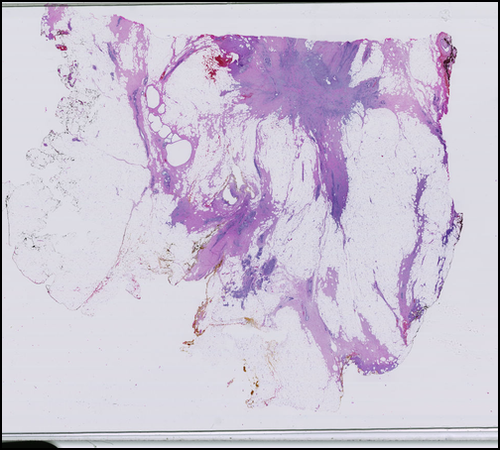

In [8]:
fig_out = pathofigure.panel_from_row(slides_df.iloc[slide_selector.index])
# can be saved with:
# fig_out.save(Path(r".\test_files\single_fig.png"))
display(fig_out)

In [9]:
# data for the current figure can be collected with:
myfig.get_data()

{'rotation': 0,
 'mirror': False,
 'zoom_point': (0.501, 0.5011111111111111),
 'crop': None}

In [10]:
# See what data has been saved:
slides_df

,root,file,rel_path,link,label,page,order,rotation,mirror,zoom_point,...,fig_type,panel_size,add_inset,inset_size,zoom_real_size,scale_bar,inset_scale_bar,sb_label,use_wb,label_size
0,test_files,OS-1.ndpi,OS-1.ndpi,"=HYPERLINK(""OS-1.ndpi"", ""Link"")",Type: raw,0,0,NaN,NaN,NaN,...,raw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,test_files,OS-1.ndpi,OS-1.ndpi,"=HYPERLINK(""OS-1.ndpi"", ""Link"")",Type: slide,0,1,NaN,NaN,NaN,...,slide,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,test_files,OS-1.ndpi,OS-1.ndpi,"=HYPERLINK(""OS-1.ndpi"", ""Link"")",Default,0,4,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,test_files,OS-1.ndpi,OS-1.ndpi,"=HYPERLINK(""OS-1.ndpi"", ""Link"")",Inverted,0,5,NaN,NaN,NaN,...,inverted,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,test_files,OS-1.ndpi,OS-1.ndpi,"=HYPERLINK(""OS-1.ndpi"", ""Link"")",Default no inset,0,6,NaN,NaN,NaN,...,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,test_files,OS-1.ndpi,OS-1.ndpi,"=HYPERLINK(""OS-1.ndpi"", ""Link"")",Inverted no inset,0,7,NaN,NaN,NaN,...,inverted,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,test_files,OS-1.ndpi,OS-1.ndpi,"=HYPERLINK(""OS-1.ndpi"", ""Link"")",Default no wb,0,8,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
7,test_files,OS-1.ndpi,OS-1.ndpi,"=HYPERLINK(""OS-1.ndpi"", ""Link"")",Default Crop,0,12,295.025151,0.0,"(0.8936627138253562, 0.524015281048121)",...,NaN,NaN,NaN,NaN,500.0,5000.0,150.0,1.0,NaN,NaN
8,test_files,OS-1.ndpi,OS-1.ndpi,"=HYPERLINK(""OS-1.ndpi"", ""Link"")",Inverted Crop,0,13,133.273384,0.0,"(0.7381058729621324, 0.23382440965871715)",...,inverted,NaN,NaN,NaN,500.0,150.0,5000.0,1.0,NaN,NaN
9,test_files,OS-2.ndpi,OS-2.ndpi,"=HYPERLINK(""OS-2.ndpi"", ""Link"")",Default,1,0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,500.0,5000.0,150.0,1.0,NaN,NaN


In [11]:
# slide parameters are saved in slide_df. This can be saved to the original excel file.
with pd.ExcelWriter(slides_excel, mode="a", engine="openpyxl", if_sheet_exists="replace") as writer:
    slides_df.to_excel(writer, sheet_name="slides")  

### Automated slide figure creation 
Slide parameters are taken from slides_df generated above<br>
Parameters for multi-panel pages are taken from slides_df and pages sheet of excel workbook

In [12]:
pages_df = pd.read_excel(slides_excel,sheet_name="pages", index_col=0)

In [13]:
pages_df

,page,title1,title2,title3,footer,filename,figsize,n_x,n_y
0,0,OS-1,PATHOverview example page 0,NaN,NaN,test_files\page0.png,NaN,4,6
1,1,OS-2,PATHOverview example page 1,NaN,NaN,test_files\page1.png,NaN,2,2
2,2,NaN,NaN,NaN,0.0,test_files\OS1_single.png,"(4,4)",1,1


Default parameters for figure page layout can be set for the pathofigure class.<br>
Titles and footers are formatted with \**globals variables at time of use.

In [14]:
# Variables to globally set page layout
# These will be used when no values are given in the excel sheets
# Variables are stored in a dict in pathofigure.fig_defaults
display(pathofigure.fig_defaults)

# Can be set with:
# pathofigure.fig_defaults["fig_type"] = "inverted"
# pathofigure.fig_defaults["footer"] = ""
# pathofigure.fig_defaults["title1"] = ""
# pathofigure.fig_defaults["label_size"] = 24
# pathofigure.fig_defaults["bw"] = 6
# pathofigure.fig_defaults["fill_color"] = "auto"

{'fig_type': None,
 'panel_size': (500, 500),
 'scale_bar': 'auto',
 'sb_label': True,
 'sb_label_size': None,
 'crop_real_width': None,
 'fill_color': 'auto',
 'use_wb': True,
 'add_inset': True,
 'inset_size': None,
 'zoom_real_size': 250,
 'inset_scale_bar': 'auto',
 'label': None,
 'label_size': 'auto',
 'label_position': 'br',
 'label_ypad': 5,
 'label_xpad': 5,
 'label_color': '#000000',
 'figsize': (8.27, 11.69),
 'n_x': 4,
 'n_y': 6,
 'fig_layout': 'compressed',
 'dpi': 300,
 'title1': '',
 'footer': 'Created with PATHOverview. github.com/EpiCENTR-Lab/PATHOverview',
 'rotation': None,
 'mirror': None,
 'crop': None,
 'zoom_point': None,
 'wb_point': None,
 'root': None,
 'file': None,
 'title2': None,
 'title3': None,
 'mpp_x': None}

#### Create a figure/page using pathoverview.pathofigure.fig_from_df()
Parameters are taken from pages_df and slides_df. Returned images are stored in pgs list for later use / addition to a multipage pdf.

In [15]:
pgs = []
for index, row in pages_df.iterrows():
    pg = pathofigure.fig_from_df(slides_df[slides_df["page"]==row["page"]], row)
    pgs.append(pg)
    # save this individual figure/page. This uses the matplotlib builtin savefig so 
    # filenames should be wrapped in Path to ensure win/mac compatability
    pg.savefig(Path(row["filename"]))
    print(f"Page {index} done")
    #break
print(f"Total pages: {len(pgs)}")

Page 0 done
Page 1 done
Page 2 done
Total pages: 3


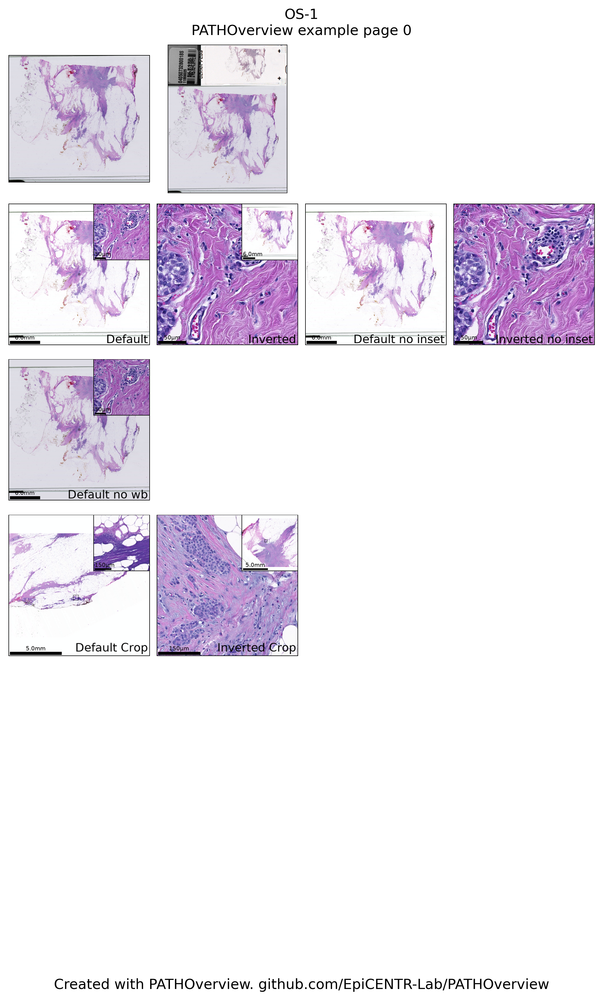

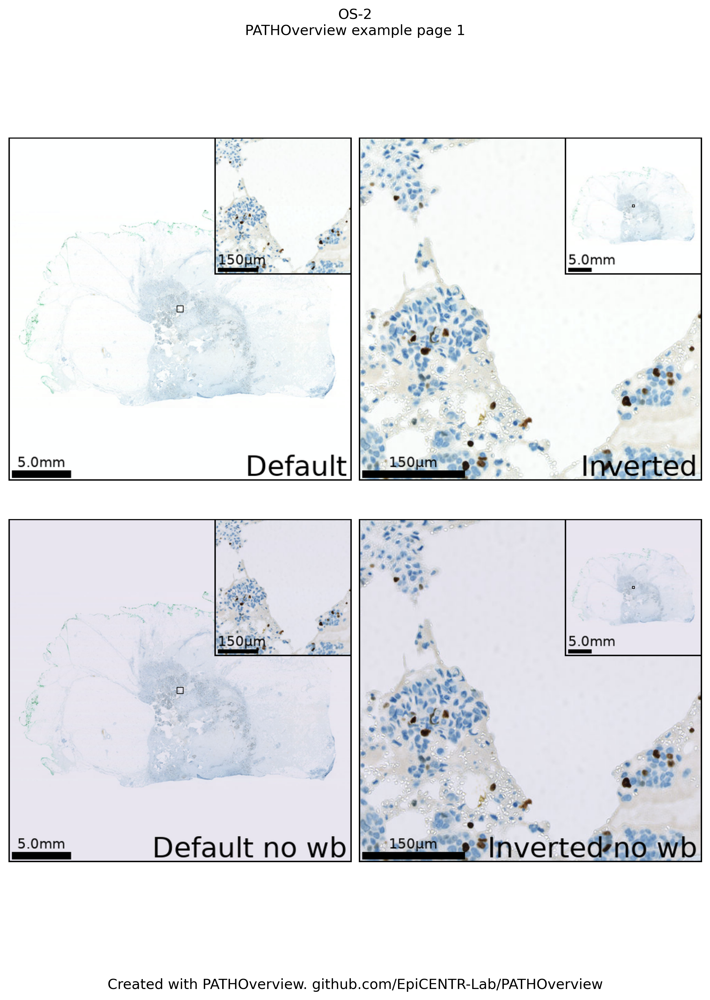

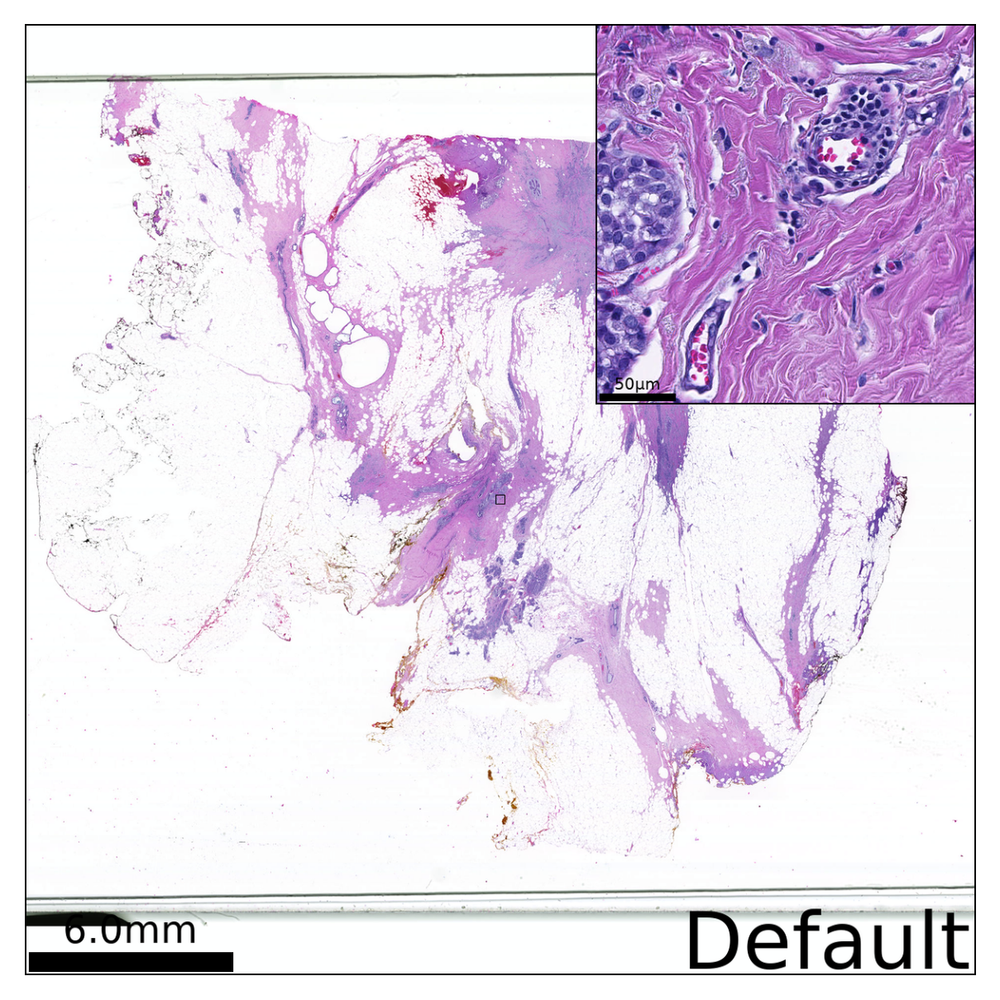

In [16]:
for p in pgs:
    display(p)

#### Create multi-page pdf of figures generated above.
Use pathoverview.pathofigure.save_pdf() to add all figures/pages in pgs to a single pdf

In [17]:
pdf_filename = Path(r".\test_files\test_output_high.pdf")
pathofigure.save_pdf(pgs, pdf_filename)

Export a lower resolution pdf

In [18]:
pdf_filename = Path(r".\test_files\test_output.pdf")
pathofigure.save_pdf(pgs, pdf_filename, dpi=150)

#### Tidy up the open pages (figures)

In [19]:
for p in pgs:
    plt.close(p)